## Import Packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import os, sys
import re
from os import listdir
import pylab as pl # for printing equations on plots
import glob
from os.path import isfile, join
import seaborn as sns
from sklearn import linear_model
from sklearn.metrics import r2_score, mean_absolute_error
import colorsys
from scipy.stats import ks_2samp
from numpy import nan
from sklearn import model_selection
from sklearn.cross_decomposition import PLSRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score, train_test_split, RepeatedKFold, cross_val_predict
from sklearn.metrics import r2_score, mean_squared_error, precision_score, recall_score, mean_absolute_error
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, LeaveOneOut, cross_validate
from sklearn.metrics import make_scorer
from numpy import absolute, mean, std
from scipy.stats import iqr
%matplotlib inline

## Read asd data of plastic keys

Text(0, 0.5, 'Reflectance')

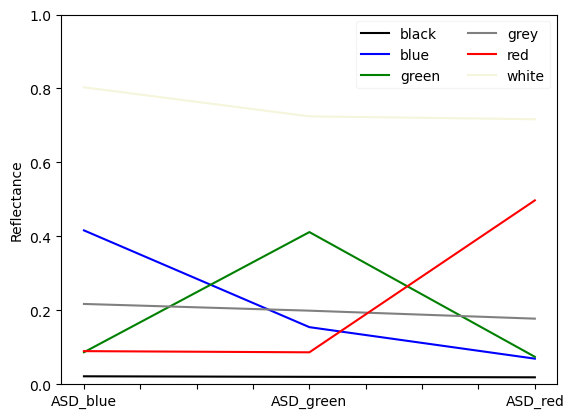

In [2]:
df = pd.read_csv(r"./2_ASDSpectra_&_SoilData/asd_ppm_key_shiftcorrected.csv", index_col = 0)
colors = ['black', 'blue', 'green', 'grey', 'red', 'beige']
df.drop('wr', axis = 0, inplace=True)
df = df.groupby(by='Sample').mean()
df = df.iloc[:,50:400]
df.columns = [int(i) for i in df.columns]
df_asd = df.groupby(by='Sample').mean().loc[:,np.r_[437,507,630]]
df_asd.columns = ['ASD_blue','ASD_green','ASD_red']
df_asd.T.plot(color=colors)
plt.ylim([0, 1])
plt.legend(ncol=2, fancybox=True, framealpha=0.2, loc='upper right')
plt.ylabel('Reflectance')
# plt.savefig('./2_PPM_ASD_Spectra/Keys_Spectra.png', dpi=300, bbox_inches='tight')
# df_asd

## Search folders for image data files

In [3]:
# Input Data
folder1 = r'./3_ENVI_ASCI_IMAGES/Folder1'
pathFolder1 = sorted(glob.glob(folder1 + r'/*.txt'))

folder2 = r'./3_ENVI_ASCI_IMAGES/Folder2'
pathFolder2 = sorted(glob.glob(folder2 + r'/*.txt'))

pathFolder = pathFolder1 + pathFolder2

# Set folder for output data
output_folder = '4_Calibration_Plots'
reflectanceFName = 'ASD_DNRef_Combined_Folder_Mean.xlsx' # Output final reflectance file for soils
pathFolder

['./3_ENVI_ASCI_IMAGES/output/Folder1\\a1_a5_b1_b5.txt',
 './3_ENVI_ASCI_IMAGES/output/Folder1\\b6_b11_c1_c5.txt',
 './3_ENVI_ASCI_IMAGES/output/Folder1\\c6_c12_o1_o4.txt',
 './3_ENVI_ASCI_IMAGES/output/Folder1\\e1_e5_e6_e9.txt',
 './3_ENVI_ASCI_IMAGES/output/Folder1\\h11_h14_ec1_ec2.txt',
 './3_ENVI_ASCI_IMAGES/output/Folder1\\h1_h5_h6_h10.txt',
 './3_ENVI_ASCI_IMAGES/output/Folder1\\j1_j3_p1_p3.txt',
 './3_ENVI_ASCI_IMAGES/output/Folder1\\k1_k5_k6_k8_w1.txt',
 './3_ENVI_ASCI_IMAGES/output/Folder1\\s11_s15_s16_s19.txt',
 './3_ENVI_ASCI_IMAGES/output/Folder1\\s1_s5_s6_s10.txt',
 './3_ENVI_ASCI_IMAGES/output/Folder2\\a1_a5_b1_b5.txt',
 './3_ENVI_ASCI_IMAGES/output/Folder2\\b6_b11_c1_c5.txt',
 './3_ENVI_ASCI_IMAGES/output/Folder2\\c6_c12_o1_o4.txt',
 './3_ENVI_ASCI_IMAGES/output/Folder2\\e1_e5_e6_e9.txt',
 './3_ENVI_ASCI_IMAGES/output/Folder2\\h11_h14_ec1_ec2.txt',
 './3_ENVI_ASCI_IMAGES/output/Folder2\\h1_h5_h6_h10.txt',
 './3_ENVI_ASCI_IMAGES/output/Folder2\\j1_j3_p1_p3_w1.txt',
 './3_

## Function for converting the ASCII to data frame and combining ASD data

In [4]:
def txt_to_df(path):      
    txt = open(path).readlines()
    idx = ['DN_red','DN_green','DN_blue']  
    col=[]
    for i in txt:
        a=i.strip().split()
        if a[0] =='Column':
            col.append(a[3])
    col=col[1:]
    data = [i.strip().split()[1:] for i in txt[-3::]]
    df = pd.DataFrame(data, columns = col, index = idx).sort_index(ascending=True).T
    df = df.astype(float)
    return(df)

In [5]:
# Combining ASD Reftectance of Keys with DN values - Folder 1
count = 0
dfs1 = []
for address in pathFolder1:
    dataImported = txt_to_df(pathFolder1[count]).loc[['black','blue', 'green', 'grey', 'red', 'white']]
    dfs1.append(pd.concat([df_asd, dataImported], axis=1))
    count = count + 1
dfs1[0]

,ASD_blue,ASD_green,ASD_red,DN_blue,DN_green,DN_red
black,0.021208,0.019763,0.018448,37.363636,43.916667,41.174242
blue,0.416009,0.154160,0.068930,203.808511,100.095745,51.978723
green,0.086232,0.411400,0.073916,102.287879,222.196970,27.250000
grey,0.216953,0.198784,0.177176,170.028846,169.394231,161.875000
red,0.089291,0.086120,0.497181,39.163462,78.490385,239.826923
white,0.803127,0.724540,0.716703,241.357143,237.919643,233.705357


In [6]:
# Combining ASD Reftectance of Keys with DN values - Folder 2
count = 0
dfs2 = []
for address in pathFolder2:
    dataImported = txt_to_df(pathFolder2[count]).loc[['black','blue', 'green', 'grey', 'red', 'white']]
    dfs2.append(pd.concat([df_asd, dataImported], axis=1))
    count = count + 1
dfs2[0]

,ASD_blue,ASD_green,ASD_red,DN_blue,DN_green,DN_red
black,0.021208,0.019763,0.018448,74.227273,72.465909,63.079545
blue,0.416009,0.154160,0.068930,218.098214,125.214286,89.687500
green,0.086232,0.411400,0.073916,122.223404,225.138298,52.744681
grey,0.216953,0.198784,0.177176,211.712121,199.507576,188.583333
red,0.089291,0.086120,0.497181,99.617647,111.941176,239.264706
white,0.803127,0.724540,0.716703,241.456897,235.293103,229.491379


In [7]:
# Average DN from both image datasets

dfs = []
for i in range(0, 10):
    temp = (dfs1[i] + dfs2[i])/2
    dfs.append(temp)
# dfs[0]

## Curve fitting on all data

In [8]:
# Curve Fitting

def curveFitting(X, y, degree):
    poly = np.polyfit(X, y, degree)
    if degree == 1:
        x_range = np.linspace(np.min(X), np.max(X) + 0.05, 3)
        poly_trend = np.polyval(poly, x_range)
    elif degree > 1:
        x_range = np.linspace(np.min(X), np.max(X) + 0.05, 100)
        poly_trend = np.polyval(poly, x_range)
    y_hat = np.polyval(poly, X)
    rsquared = r2_score(y, y_hat)
    rmse = np.sqrt(np.mean(np.power((y - y_hat), 2)))
    return poly, x_range, poly_trend, rsquared, rmse

def curveFittingExp(X, y):
    poly = np.polyfit(X, np.log(y), 1)
    a = np.exp(poly[1])
    b = poly[0]
    x_range = np.linspace(np.min(X), np.max(X) + 0.05, 100)
    poly_trend = a * np.exp(b * x_range)
    y_hat = a * np.exp(b * X)
    rsquared = r2_score(y, y_hat)
    rmse = np.sqrt(np.mean(np.power((y - y_hat), 2)))
    return poly, x_range, poly_trend, rsquared, rmse

def poly2latex(poly, variable = "x", width = 3):
    t = ["{0:0.{width}f}"]
    t.append("(" + t[-1] + ") " + " {variable}")
    t.append(t[-1] + "^{1}")
    def f():
        for i, v in enumerate(reversed(poly)):
            idx = i if i < 2 else 2
            yield t[idx].format(v, i, variable=variable, width=width)
    return "${}$".format("+".join(f()))

# DN Value Scaling
def scaling(DN_ref):
    maxBlue = max(DN_ref['DN_blue'])
    maxGreen = max(DN_ref['DN_green'])
    maxRed = max(DN_ref['DN_red'])
    DN_ref['DN_blue'] = DN_ref['DN_blue'] / maxBlue
    DN_ref['DN_green'] = DN_ref['DN_green'] / maxGreen
    DN_ref['DN_red'] = DN_ref['DN_red'] / maxRed
    return DN_ref, maxBlue, maxGreen, maxRed

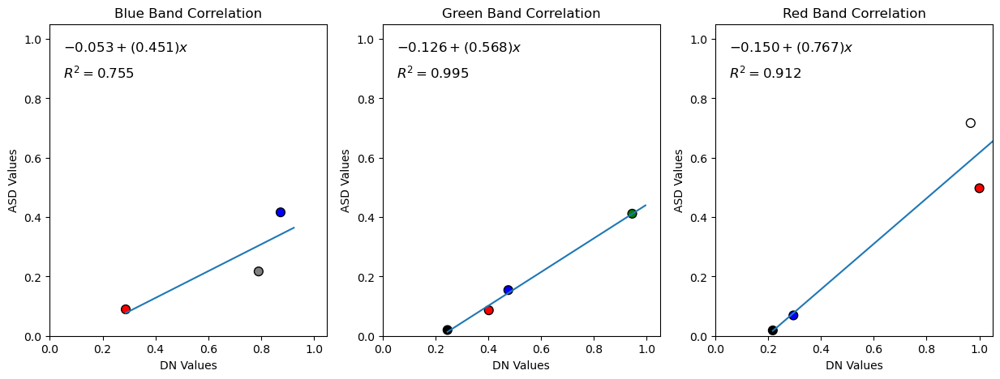

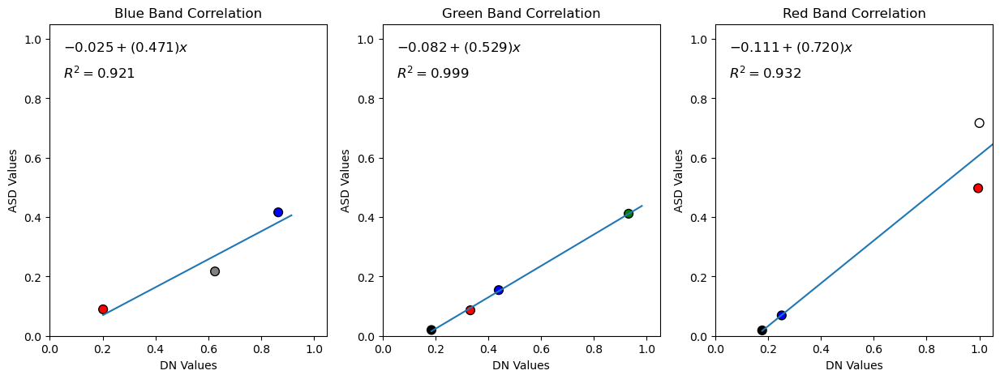

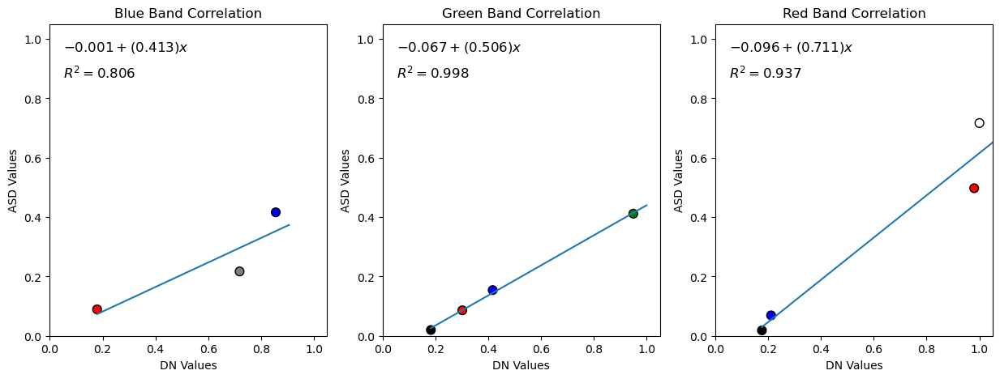

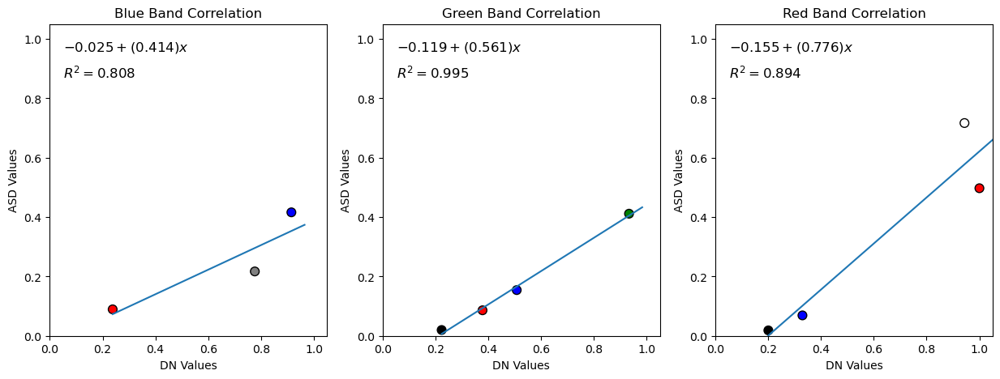

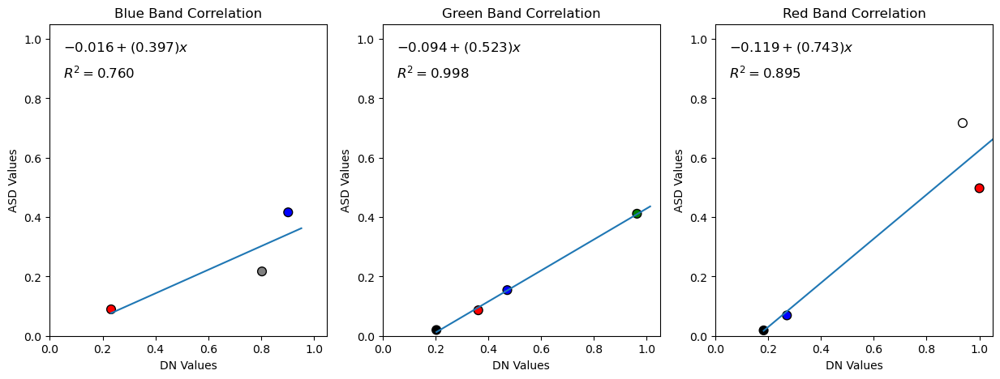

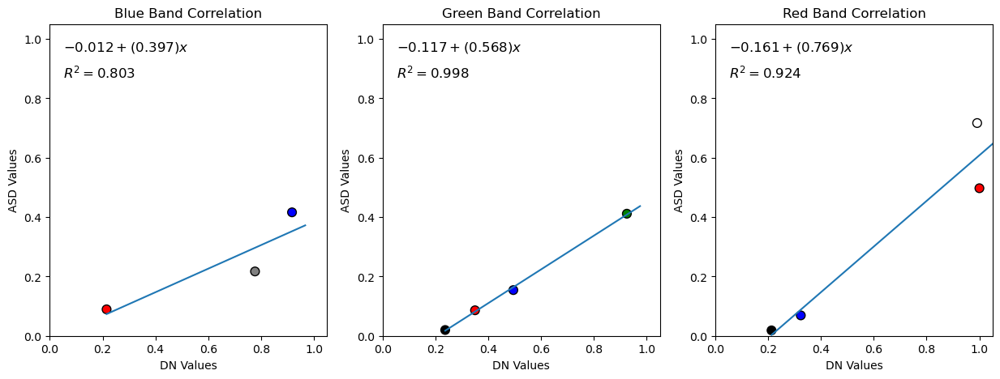

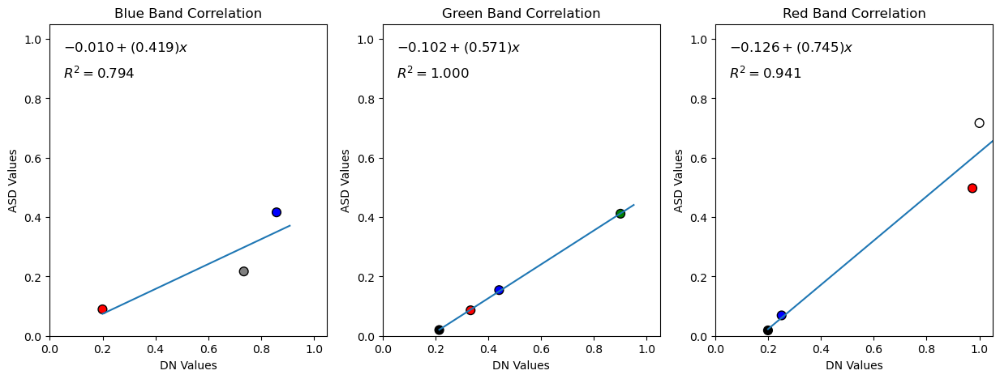

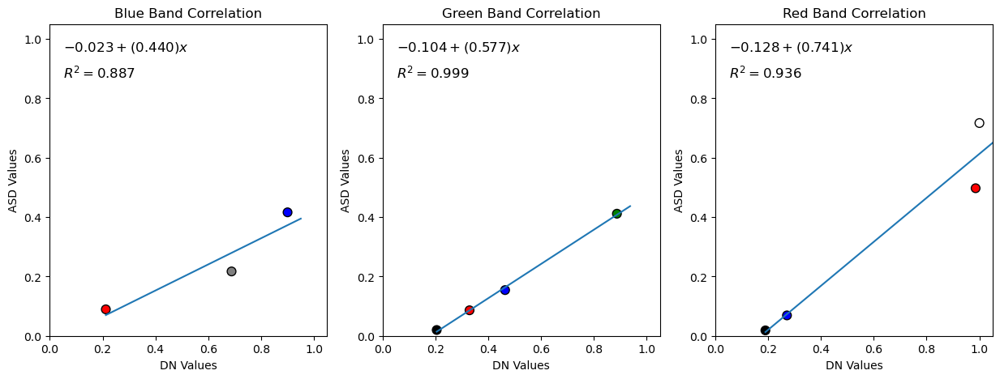

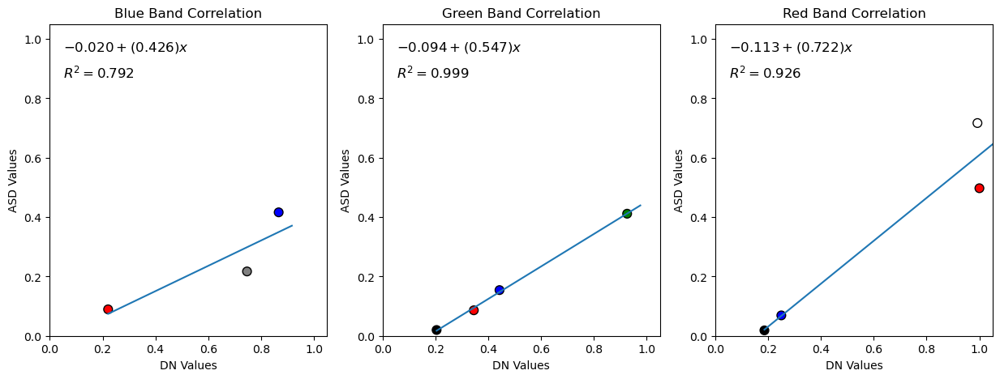

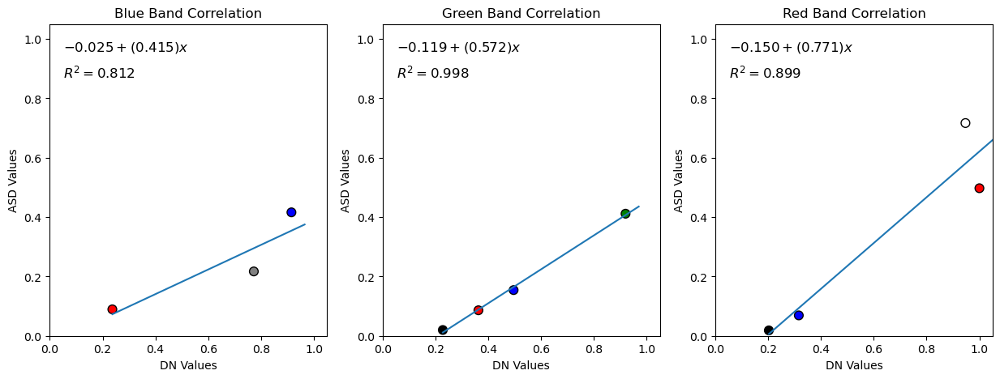

In [9]:
#  ALL COLOURS
DN_refs = dfs
point_size = 60
edge = "black"
colors = ['black', 'blue', 'green', 'grey', 'red', 'white']

# if folderNumber=='1':
colors1 = ['blue', 'red', 'grey']
colors2 = ['black', 'blue', 'green', 'red']
colors3 = ['black', 'blue', 'red', 'white']
degreeBlue = 1
degreeGreen = 1 # 1 for exponential fitting & 1d fitting
degreeRed = 1

count = 0

coeffBlue = np.empty((10, degreeBlue+1))
coeffGreen = np.empty((10, degreeGreen+1))
coeffRed = np.empty((10, degreeRed+1))
maxOfImages = np.empty((10, 3))

for dnDF in DN_refs:
    fig, ax = plt.subplots(1,3, figsize = (15,5))
    DN_ref, maxBlue, maxGreen, maxRed = scaling(dnDF)
    maxOfImages[count] = [maxBlue, maxGreen, maxRed]
    ## Relation between DN Blue and ASD Blue
    X = DN_ref['DN_blue'][colors1]
    y = DN_ref['ASD_blue'][colors1]
#     fname = str(count + 1) + '_df.xlsx'
#     DN_ref.to_excel(fname)
    poly, x_range, poly_trend, rsquared, rmseB = curveFitting(X, y, degreeBlue)
#     poly, x_range, poly_trend, rsquared = curveFittingExp(X, y)
    ax[0].scatter(X, y, c = colors1, edgecolors = edge, s = point_size)
    ax[0].set_xlabel('DN Values')
    ax[0].set_ylabel('ASD Values')
    ax[0].set_ylim(0, 1.05)
    ax[0].set_xlim(0, 1.05)
    ax[0].set_title('Blue Band Correlation')
    ax[0].plot(x_range, poly_trend)
    plt.gca().text(0.05, 0.95, poly2latex(poly), fontsize=12, verticalalignment='top',horizontalalignment='left', transform=ax[0].transAxes)
    textRSq = f"\n$R^2 = {rsquared:0.3f}$"
    plt.gca().text(0.05, 0.92, textRSq, fontsize=12, verticalalignment='top',horizontalalignment='left', transform=ax[0].transAxes)
    coeffBlue[count][0] = poly[0]
    coeffBlue[count][1] = poly[1]
#     coeffBlue[count][2] = poly[2]
   
    # ******************************************************************************************************************
    
    ## Relation between DN Green and ASD Green
    X = DN_ref['DN_green'][colors2]
    y = DN_ref['ASD_green'][colors2]
    poly, x_range, poly_trend, rsquared, rmseG = curveFitting(X, y, degreeGreen)
#     poly, x_range, poly_trend, rsquared = curveFittingExp(X, y)
    ax[1].scatter(X, y, c = colors2, edgecolors = edge, s = point_size)
    ax[1].set_xlabel('DN Values')
    ax[1].set_ylabel('ASD Values')
    ax[1].set_ylim(0, 1.05)
    ax[1].set_xlim(0, 1.05)
    ax[1].set_title('Green Band Correlation')
    ax[1].plot(x_range, poly_trend)
    plt.gca().text(0.05, 0.95, poly2latex(poly), fontsize=12, verticalalignment='top',horizontalalignment='left', transform=ax[1].transAxes)
    textRSq = f"\n$R^2 = {rsquared:0.3f}$"
    plt.gca().text(0.05, 0.92, textRSq, fontsize=12, verticalalignment='top',horizontalalignment='left', transform=ax[1].transAxes)
    coeffGreen[count][0] = poly[0]
    coeffGreen[count][1] = poly[1]
#     coeffGreen[count][2] = poly[2]
    
    # ******************************************************************************************************************
    
    ## Relation between DN Red and ASD Red
    X = DN_ref['DN_red'][colors3]
    y = DN_ref['ASD_red'][colors3]
    poly, x_range, poly_trend, rsquared, rmseR = curveFitting(X, y, degreeRed)
    ax[2].scatter(X, y, c = colors3, edgecolors = edge, s = point_size)
    ax[2].set_xlabel('DN Values')
    ax[2].set_ylabel('ASD Values')
    ax[2].set_ylim(0, 1.05)
    ax[2].set_xlim(0, 1.05)
    ax[2].set_title('Red Band Correlation')
    ax[2].plot(x_range, poly_trend)
    plt.gca().text(0.05, 0.95, poly2latex(poly), fontsize=12, verticalalignment='top',horizontalalignment='left', transform=ax[2].transAxes)
    textRSq = f"\n$R^2 = {rsquared:0.3f}$"
    plt.gca().text(0.05, 0.92, textRSq, fontsize=12, verticalalignment='top',horizontalalignment='left', transform=ax[2].transAxes) 
    coeffRed[count][0] = poly[0]
    coeffRed[count][1] = poly[1]
#     coeffRed[count][2] = poly[2]
    count = count + 1
    plt.savefig(output_folder+'/EquationPlot_'+str(count)+'.png', bbox_inches='tight', dpi=300, transparent=False)
    plt.show()

In [10]:
maxImages = maxOfImages
maxImages

array([[241.40702  , 236.606373 , 239.5458145],
       [239.38375  , 232.50375  , 227.06875  ],
       [229.8806895, 222.6077585, 217.0089655],
       [243.655    , 238.359643 , 246.877841 ],
       [236.101923 , 231.4170515, 242.3541665],
       [239.8189105, 234.0106455, 230.754765 ],
       [237.202202 , 230.2690915, 224.6697325],
       [235.0844645, 228.9239285, 223.7289285],
       [242.6429715, 234.919185 , 231.204934 ],
       [244.72516  , 237.9591345, 245.853125 ]])

## Importing Soil Reflectance of ASD

In [11]:
# Import ASD Reflectance of Soils

df_soil_asd = pd.read_csv(r"./2_ASDSpectra_&_SoilData/asd_soil_spectra.csv", index_col = 0)
df_soil_asd.columns = ['ASD_blue','ASD_green','ASD_red']

# df_soil_asd = df_soil_asd#.loc[soils]
# df_soil_asd.T.plot(legend=None)
# print(df_soil_asd)
df_soil_asd

,ASD_blue,ASD_green,ASD_red
Soil,,,
A1,0.062922,0.076222,0.158556
A2,0.059570,0.072970,0.135275
A3,0.068655,0.082081,0.142310
A4,0.071368,0.088573,0.176288
A5,0.116488,0.147114,0.226134
...,...,...,...
S9,0.141000,0.200000,0.365000
W1,0.142000,0.199000,0.424000
YA10,0.036800,0.049369,0.122212


In [12]:
# Combining ASD Reftectance of Soils with DN values - Folder 1
count = 0
dfs_soil1 = []
for address in pathFolder1:
    soilDataImported = txt_to_df(pathFolder1[count])#.loc[[x.lower() for x in soils]]
    soilDataImported.index = soilDataImported.index.str.upper()
    dfs_soil1.append(pd.concat([df_soil_asd, soilDataImported], axis=1))
    dfs_soil1[count].dropna(axis=0, how='any', inplace=True)
    count = count + 1
# dfs_soil1[0]

In [13]:
# Combining ASD Reftectance of Soils with DN values - Folder 2
count = 0
dfs_soil2 = []
for address in pathFolder2:
    soilDataImported = txt_to_df(pathFolder2[count])#.loc[[x.lower() for x in soils]]
    soilDataImported.index = soilDataImported.index.str.upper()
    dfs_soil2.append(pd.concat([df_soil_asd, soilDataImported], axis=1))
    dfs_soil2[count].dropna(axis=0, how='any', inplace=True)
    count = count + 1
# dfs_soil2[0]

In [14]:
# Combining Folder 1 and Folder 2 data
dfs_soil = []
for i in range(0, 10):
    temp = (dfs_soil1[i] + dfs_soil2[i])/2
    dfs_soil.append(temp)
# dfs_soil[0]

## Applying Calibration Parameters on Soil DN Values

In [15]:
# define the curve fitting objective function
def objective1d(x, a, b):
    return a * x + b

def objective2d(x, a, b, c):
    return a * x**2 + b * x + c

def objective3d(x, a, b, c, d):
    return a * x**3 + b * x**2 + c * x + d

def objectiveExp(x, a, b):
    return a * np.exp(x * b)

In [16]:
DN_refs_soil = dfs_soil
soil_DN_to_REF = []
count = 0

for dnSoil in DN_refs_soil:
    # Scaled the DN values based on maximum DN value in image
    DN_ref_soil = dnSoil
    DN_ref_soil['DN_blue'] = DN_ref_soil['DN_blue'] / maxImages[count][0]
    DN_ref_soil['DN_green'] = DN_ref_soil['DN_green'] / maxImages[count][1]
    DN_ref_soil['DN_red'] = DN_ref_soil['DN_red'] / maxImages[count][2]
    
    # Applying fitting coefficients over soil data
    # Blue
    a, b =  coeffBlue[count]
    Soil_Blue_Ref = objective1d(DN_ref_soil['DN_blue'], a, b)
#     Soil_Blue_Ref[Soil_Blue_Ref < 0] = 0
    
    # Green 
    a, b =  coeffGreen[count]
    Soil_Green_Ref = objective1d(DN_ref_soil['DN_green'], a, b)
#     Soil_Green_Ref[Soil_Green_Ref < 0] = 0
    
    # Red
    a, b =  coeffRed[count]
    Soil_Red_Ref = objective1d(DN_ref_soil['DN_red'], a, b)
#     Soil_Red_Ref[Soil_Red_Ref < 0] = 0
    
    soil_DN_to_REF.append(pd.concat([Soil_Blue_Ref, Soil_Green_Ref, Soil_Red_Ref], axis=1))
    soil_DN_to_REF[count].columns = ['DN_Ref_blue','DN_Ref_green','DN_Ref_red']
    count = count + 1

soil_DN_to_REF = pd.concat(soil_DN_to_REF, axis=0)

In [17]:
soil_DN_to_REF.dropna(axis=0, inplace=True)
# soil_DN_to_REF
ASD_DNRef_Combined = pd.concat([df_soil_asd, soil_DN_to_REF], axis=1)
ASD_DNRef_Combined.dropna(axis=0, how='any', inplace=True)

# Difference between ASD and Calibrated Reflectance
ASD_DNRef_Combined['DiffBlue'] = ASD_DNRef_Combined['ASD_blue'] -  ASD_DNRef_Combined['DN_Ref_blue']
ASD_DNRef_Combined['DiffGreen'] = ASD_DNRef_Combined['ASD_green'] -  ASD_DNRef_Combined['DN_Ref_green']
ASD_DNRef_Combined['DiffRed'] = ASD_DNRef_Combined['ASD_red'] -  ASD_DNRef_Combined['DN_Ref_red']

ASD_DNRef_Combined.index.names = ['Soil']
ASD_DNRef_Combined.to_excel(reflectanceFName, index=True, header=True)
ASD_DNRef_Combined

,ASD_blue,ASD_green,ASD_red,DN_Ref_blue,DN_Ref_green,DN_Ref_red,DiffBlue,DiffGreen,DiffRed
Soil,,,,,,,,,
A1,0.062922,0.076222,0.158556,0.053843,0.069973,0.173238,0.009079,0.006249,-0.014682
A2,0.059570,0.072970,0.135275,0.050651,0.061803,0.182988,0.008919,0.011167,-0.047713
A3,0.068655,0.082081,0.142310,0.061753,0.072168,0.180541,0.006902,0.009913,-0.038231
A4,0.071368,0.088573,0.176288,0.078090,0.080129,0.175788,-0.006722,0.008444,0.000500
A5,0.116488,0.147114,0.226134,0.086347,0.105271,0.231473,0.030141,0.041843,-0.005339
...,...,...,...,...,...,...,...,...,...
S4,0.103000,0.150000,0.310000,0.176034,0.252937,0.421400,-0.073034,-0.102937,-0.111400
S6,0.131000,0.188000,0.364000,0.151820,0.227925,0.382906,-0.020820,-0.039925,-0.018906
S7,0.114000,0.167000,0.338000,0.158655,0.229646,0.381358,-0.044655,-0.062646,-0.043358


## Exporting Plots

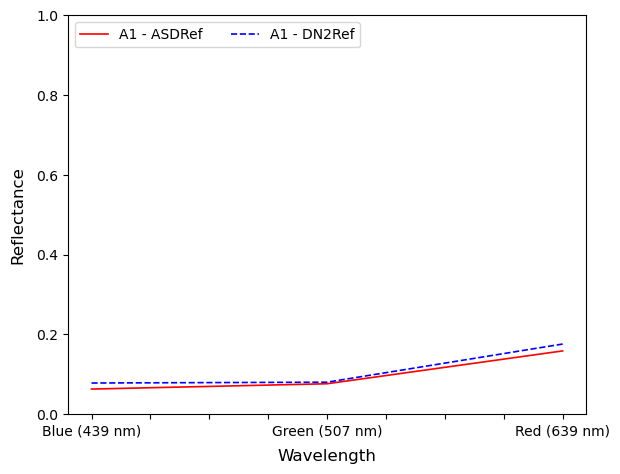

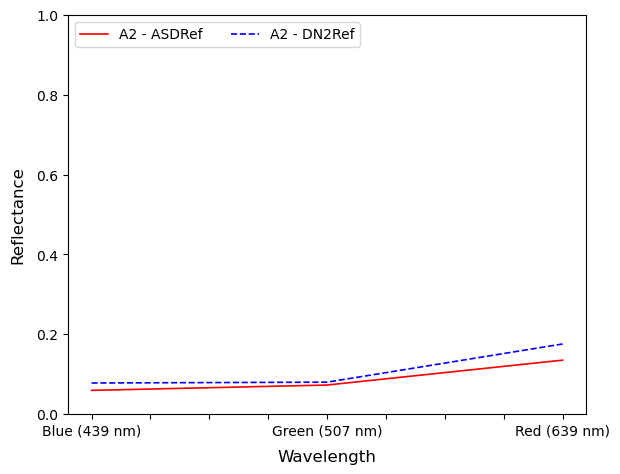

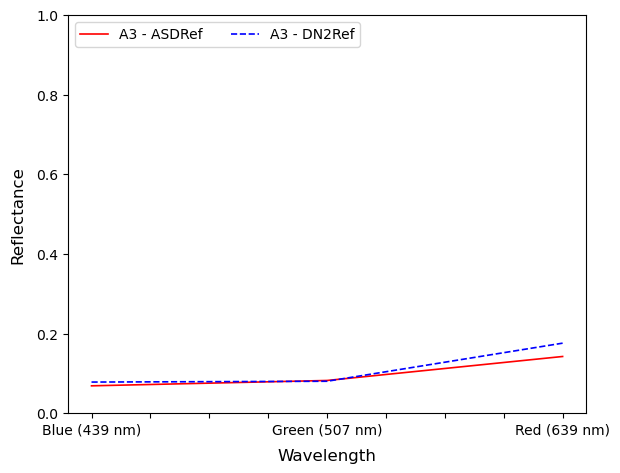

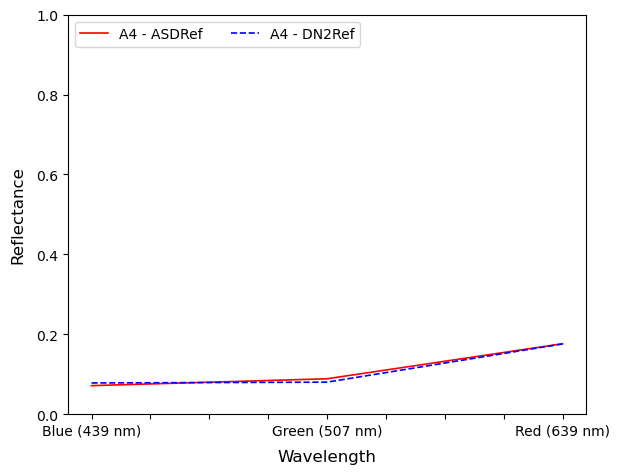

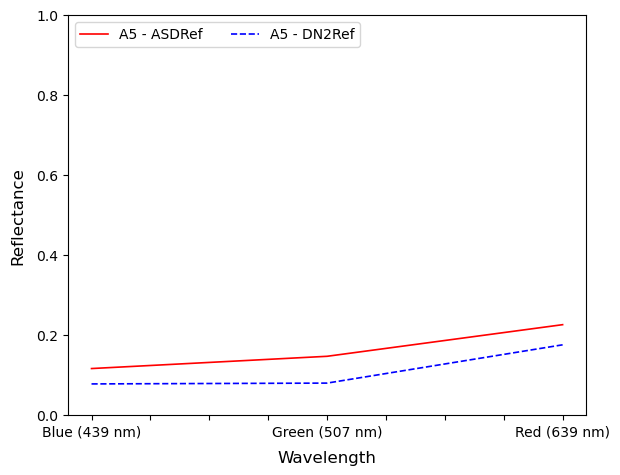

...

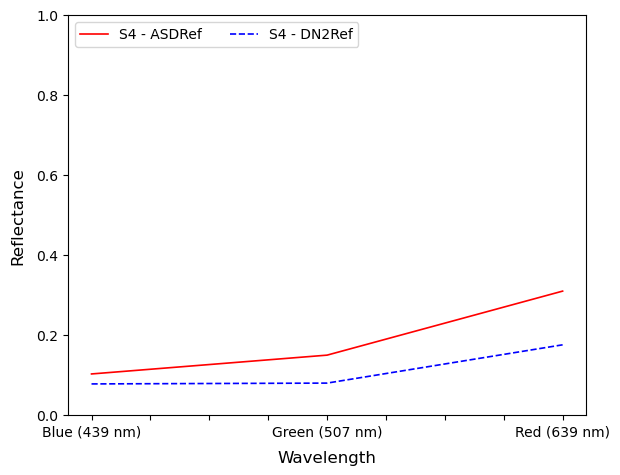

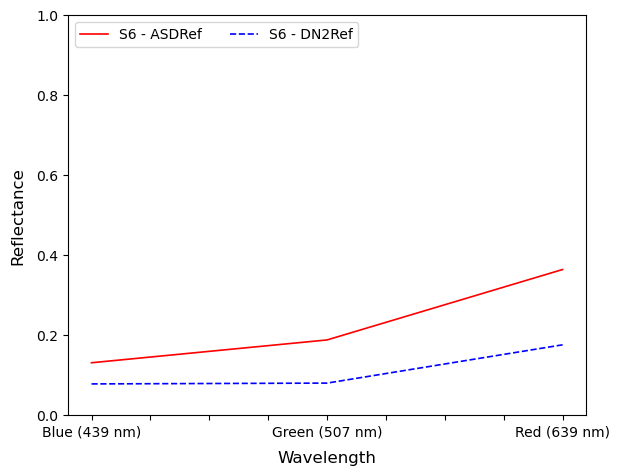

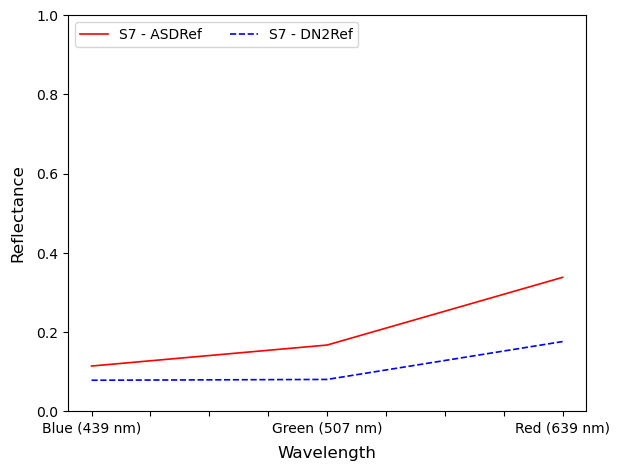

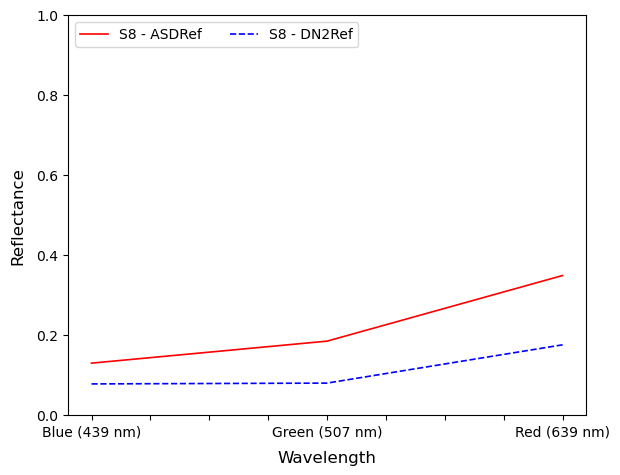

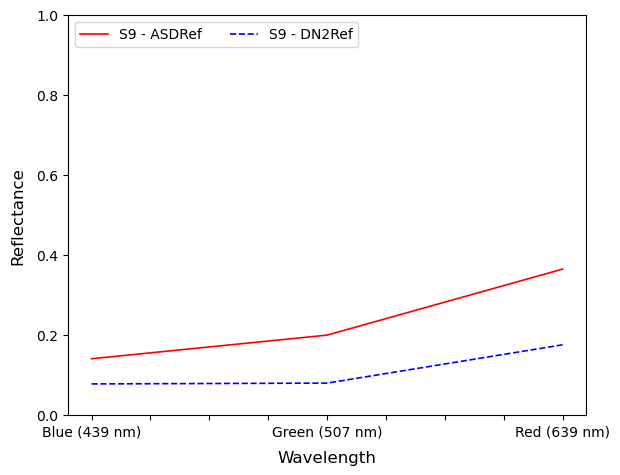

In [18]:
if not os.path.exists(output_folder):
    os.makedirs(output_folder)
# Subplots for ASD and Calibrated Ref

for i in range(0, len(ASD_DNRef_Combined)):
    fig = plt.figure()
    axis = plt.axes()
    asd_plot = ASD_DNRef_Combined[['ASD_blue', 'ASD_green', 'ASD_red']].iloc[i:i+1]
    asd_plot.T.plot(ax = axis, color='red', linewidth=1.2)
    soil_plot = ASD_DNRef_Combined[['DN_Ref_blue', 'DN_Ref_green', 'DN_Ref_red']].iloc[3:4]
    soil_plot.T.plot(ax = axis, color='blue', linewidth=1.2, linestyle='dashed')
#     plt.title('ASDRef vs DN2Ref')
    plt.xlabel('Wavelength', fontsize=12)
    plt.ylabel('Reflectance', fontsize=12)
    axis.xaxis.labelpad = 8
    axis.yaxis.labelpad = 8
    plt.legend([str(asd_plot.index[0]) + ' - ASDRef',str(asd_plot.index[0]) + ' - DN2Ref'], ncol=2, loc='upper left')
    labels = [item.get_text() for item in axis.get_xticklabels()]
    labels[1] = 'Blue (439 nm)'
    labels[5] = 'Green (507 nm)'
    labels[9] = 'Red (639 nm)'
    axis.set_xticklabels(labels)
    fig.tight_layout()
    plt.ylim([0.0, 1.0])
    fname = './' + output_folder + '/' + ASD_DNRef_Combined.index[i] + '.png'
    plt.savefig(fname, bbox_inches='tight', transparent=False)
    plt.show()
    plt.close()

## Plot Calibration Results

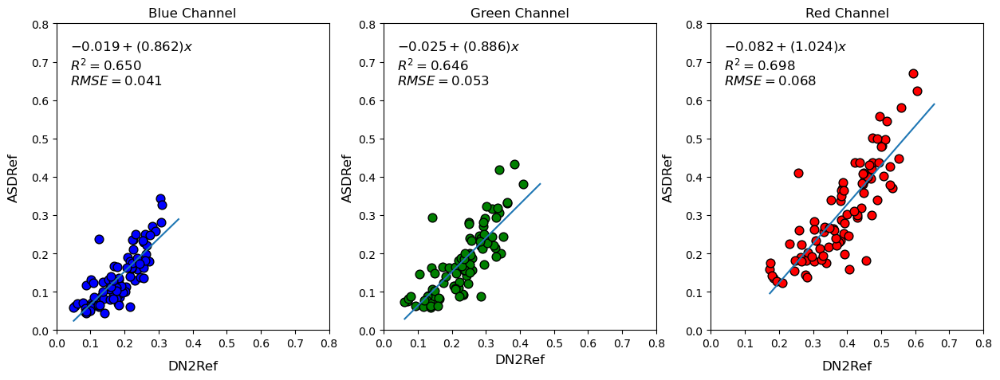

In [19]:
def plotCalibration(ASD_DNRef_Combined):
    %matplotlib inline
    edge = 'black'
    point_size = 60
    fig, ax = plt.subplots(1,3, figsize = (15,5))

    X = ASD_DNRef_Combined['DN_Ref_blue']
    y = ASD_DNRef_Combined['ASD_blue']
    poly, x_range, poly_trend, rsquared, rmseB = curveFitting(X, y, 1)
    ax[0].scatter(X, y, c = ['blue'], edgecolors = edge, s = point_size)
    ax[0].set_xlabel('DN2Ref', fontsize=12)
    ax[0].set_ylabel('ASDRef', fontsize=12)
    ax[0].set_ylim(0.0, 0.8)
    ax[0].set_xlim(0.0, 0.8)
    ax[0].xaxis.labelpad = 10
    ax[0].yaxis.labelpad = 10
    ax[0].set_title('Blue Channel', fontsize=12)
    ax[0].plot(x_range, poly_trend)
    plt.gca().text(0.05, 0.95, poly2latex(poly), fontsize=12, verticalalignment='top',horizontalalignment='left', transform=ax[0].transAxes)
    textRSq = f"\n$R^2 = {rsquared:0.3f}$\n$RMSE = {rmseB:0.3f}$"
    plt.gca().text(0.05, 0.94, textRSq, fontsize=12, verticalalignment='top',horizontalalignment='left', transform=ax[0].transAxes)


    X = ASD_DNRef_Combined['DN_Ref_green']
    y = ASD_DNRef_Combined['ASD_green']
    poly, x_range, poly_trend, rsquared, rmseG = curveFitting(X, y, 1)
    ax[1].scatter(X, y, c = ['green'], edgecolors = edge, s = point_size)
    ax[1].set_xlabel('DN2Ref', fontsize=12)
    ax[1].set_ylabel('ASDRef', fontsize=12)
    ax[1].set_ylim(0.0, 0.8)
    ax[1].set_xlim(0.0, 0.8)
    ax[2].xaxis.labelpad = 10
    ax[2].yaxis.labelpad = 10
    ax[1].set_title('Green Channel', fontsize=12)
    ax[1].plot(x_range, poly_trend)
    plt.gca().text(0.05, 0.95, poly2latex(poly), fontsize=12, verticalalignment='top',horizontalalignment='left', transform=ax[1].transAxes)
    textRSq = f"\n$R^2 = {rsquared:0.3f}$\n$RMSE = {rmseG:0.3f}$"
    plt.gca().text(0.05, 0.94, textRSq, fontsize=12, verticalalignment='top',horizontalalignment='left', transform=ax[1].transAxes)

    X = ASD_DNRef_Combined['DN_Ref_red']
    y = ASD_DNRef_Combined['ASD_red']
    poly, x_range, poly_trend, rsquared, rmseR = curveFitting(X, y, 1)
    ax[2].scatter(X, y, c = ['red'], edgecolors = edge, s = point_size)
    ax[2].set_xlabel('DN2Ref', fontsize=12)
    ax[2].set_ylabel('ASDRef', fontsize=12)
    ax[2].set_ylim(0.0, 0.8)
    ax[2].set_xlim(0.0, 0.8)
    ax[2].xaxis.labelpad = 10
    ax[2].yaxis.labelpad = 10
    ax[2].set_title('Red Channel', fontsize=12)
    ax[2].plot(x_range, poly_trend)
    plt.gca().text(0.05, 0.95, poly2latex(poly), fontsize=12, verticalalignment='top',horizontalalignment='left', transform=ax[2].transAxes)
    textRSq = f"\n$R^2 = {rsquared:0.3f}$\n$RMSE = {rmseR:0.3f}$"
    plt.gca().text(0.05, 0.94, textRSq, fontsize=12, verticalalignment='top',horizontalalignment='left', transform=ax[2].transAxes)
    fileName = output_folder + '/SoilCalibrationRMSE.png'
    plt.savefig(fileName, bbox_inches='tight', transparent=False)
    plt.show()
    return

plotCalibration(ASD_DNRef_Combined)

## Importing soil properties and generating new features

In [32]:
soilProperties = pd.read_csv('./2_ASDSpectra_&_SoilData/RGB_Soil_Data.csv', index_col = 0)

# soilProperties
soilProperties.drop(['Blue439', 'Green507', 'Red639'], axis=1, inplace=True)
finalDF = pd.concat([ASD_DNRef_Combined, soilProperties], axis=1)
finalDF.dropna(axis=0, how='any', inplace=True)
# finalDF['Mean Reflectance'] = finalDF[["DN_Ref_blue", "DN_Ref_green", "DN_Ref_red"]].mean(axis=1)
finalDF['Slope Green-Blue'] = finalDF["DN_Ref_green"] - finalDF["DN_Ref_blue"]
finalDF['Slope Red-Green'] = finalDF["DN_Ref_red"] - finalDF["DN_Ref_green"]
finalDF['Slope Red-Blue'] = finalDF["DN_Ref_red"] - finalDF["DN_Ref_blue"]
finalDF['Slope ASD GB'] = finalDF["ASD_green"] - finalDF["ASD_blue"]
finalDF['Slope ASD RG'] = finalDF["ASD_red"] - finalDF["ASD_green"]
finalDF['Slope ASD RB'] = finalDF["ASD_red"] - finalDF["ASD_blue"]

finalDF['BI'] = np.power(((np.power(finalDF["DN_Ref_red"], 2) + np.power(finalDF["DN_Ref_green"],2) + 
                                np.power(finalDF["DN_Ref_blue"],2))/3),0.5)

finalDF['SI'] = (finalDF["DN_Ref_red"] - finalDF["DN_Ref_blue"])/(finalDF["DN_Ref_red"] + finalDF["DN_Ref_blue"])

finalDF['CI'] = (finalDF["DN_Ref_red"] - finalDF["DN_Ref_green"])/(finalDF["DN_Ref_red"] + finalDF["DN_Ref_green"])

finalDF['BI_ASD'] = np.power(((np.power(finalDF["ASD_red"], 2) + np.power(finalDF["ASD_green"],2) + 
                                np.power(finalDF["ASD_blue"],2))/3),0.5)

finalDF['SI_ASD'] = (finalDF["ASD_red"] - finalDF["ASD_blue"])/(finalDF["ASD_red"] + finalDF["ASD_blue"])

finalDF['CI_ASD'] = (finalDF["ASD_red"] - finalDF["ASD_green"])/(finalDF["ASD_red"] + finalDF["ASD_green"])

soilFullData = './' + output_folder + '/' + 'FullSoilData_Folder'
with pd.ExcelWriter(soilFullData + ".xlsx") as writer:
    finalDF.to_excel(writer, sheet_name='soilFullData', index=True, header=True)
writer=None
finalDF.head(5)

,ASD_blue,ASD_green,ASD_red,DN_Ref_blue,DN_Ref_green,DN_Ref_red,DiffBlue,DiffGreen,DiffRed,Sand (% wt.),...,Slope Red-Blue,Slope ASD GB,Slope ASD RG,Slope ASD RB,BI,SI,CI,BI_ASD,SI_ASD,CI_ASD
Soil,,,,,,,,,,,,,,,,,,,,,
A1,0.062922,0.076222,0.158556,0.053843,0.069973,0.173238,0.009079,0.006249,-0.014682,26.1449,...,0.119396,0.013300,0.082334,0.095634,0.112260,0.525786,0.424594,0.107872,0.431799,0.350689
A2,0.059570,0.072970,0.135275,0.050651,0.061803,0.182988,0.008919,0.011167,-0.047713,24.9016,...,0.132336,0.013400,0.062305,0.075705,0.115282,0.566414,0.495057,0.095171,0.388540,0.299191
A3,0.068655,0.082081,0.142310,0.061753,0.072168,0.180541,0.006902,0.009913,-0.038231,35.4214,...,0.118788,0.013426,0.060229,0.073655,0.117781,0.490265,0.428844,0.102799,0.349134,0.268411
A4,0.071368,0.088573,0.176288,0.078090,0.080129,0.175788,-0.006722,0.008444,0.000500,35.1233,...,0.097698,0.017205,0.087715,0.104920,0.120306,0.384821,0.373791,0.121128,0.423652,0.331174
A5,0.116488,0.147114,0.226134,0.086347,0.105271,0.231473,0.030141,0.041843,-0.005339,30.4319,...,0.145127,0.030626,0.079020,0.109646,0.155046,0.456631,0.374774,0.169655,0.320020,0.211709


## Plot Indices

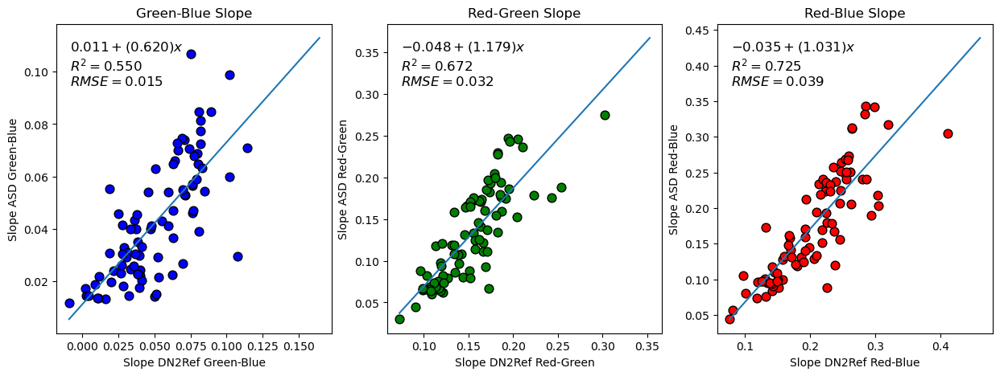

In [33]:
def plotSlope(finalDF):
    %matplotlib inline
    edge = 'black'
    point_size = 60
    fig, ax = plt.subplots(1,3, figsize = (15,5))

    X = finalDF['Slope Green-Blue']
    y = finalDF['Slope ASD GB']
    poly, x_range, poly_trend, rsquared, rmseB = curveFitting(X, y, 1)
    ax[0].scatter(X, y, c = ['blue'], edgecolors = edge, s = point_size)
    ax[0].set_xlabel('Slope DN2Ref Green-Blue')
    ax[0].set_ylabel('Slope ASD Green-Blue')
#     ax[0].set_ylim(0, 0.80)
#     ax[0].set_xlim(0, 0.80)
    ax[0].set_title('Green-Blue Slope')
    ax[0].plot(x_range, poly_trend)
    plt.gca().text(0.05, 0.95, poly2latex(poly), fontsize=12, verticalalignment='top',horizontalalignment='left', transform=ax[0].transAxes)
    textRSq = f"\n$R^2 = {rsquared:0.3f}$\n$RMSE = {rmseB:0.3f}$"
    plt.gca().text(0.05, 0.94, textRSq, fontsize=12, verticalalignment='top',horizontalalignment='left', transform=ax[0].transAxes)

    X = finalDF['Slope Red-Green']
    y = finalDF['Slope ASD RG']
    poly, x_range, poly_trend, rsquared, rmseG = curveFitting(X, y, 1)
    ax[1].scatter(X, y, c = ['green'], edgecolors = edge, s = point_size)
    ax[1].set_xlabel('Slope DN2Ref Red-Green')
    ax[1].set_ylabel('Slope ASD Red-Green')
#     ax[1].set_ylim(0, 0.80)
#     ax[1].set_xlim(0, 0.80)
    ax[1].set_title('Red-Green Slope')
    ax[1].plot(x_range, poly_trend)
    plt.gca().text(0.05, 0.95, poly2latex(poly), fontsize=12, verticalalignment='top',horizontalalignment='left', transform=ax[1].transAxes)
    textRSq = f"\n$R^2 = {rsquared:0.3f}$\n$RMSE = {rmseG:0.3f}$"
    plt.gca().text(0.05, 0.94, textRSq, fontsize=12, verticalalignment='top',horizontalalignment='left', transform=ax[1].transAxes)

    X = finalDF['Slope Red-Blue']
    y = finalDF['Slope ASD RB']
    poly, x_range, poly_trend, rsquared, rmseR = curveFitting(X, y, 1)
    ax[2].scatter(X, y, c = ['red'], edgecolors = edge, s = point_size)
    ax[2].set_xlabel('Slope DN2Ref Red-Blue')
    ax[2].set_ylabel('Slope ASD Red-Blue')
#     ax[2].set_ylim(0, 0.80)
#     ax[2].set_xlim(0, 0.80)
    ax[2].set_title('Red-Blue Slope')
    ax[2].plot(x_range, poly_trend)
    plt.gca().text(0.05, 0.95, poly2latex(poly), fontsize=12, verticalalignment='top',horizontalalignment='left', transform=ax[2].transAxes)
    textRSq = f"\n$R^2 = {rsquared:0.3f}$\n$RMSE = {rmseR:0.3f}$"
    plt.gca().text(0.05, 0.94, textRSq, fontsize=12, verticalalignment='top',horizontalalignment='left', transform=ax[2].transAxes)
    fileName = output_folder + '/Slope_ASD_DN2Ref.png'
    plt.savefig(fileName, bbox_inches='tight', transparent=False)
    plt.show()
    return

plotSlope(finalDF)

## Common function and data spliting

In [22]:
def evaluate(model, test_features, test_labels):
    predictions = model.predict(test_features)
    errors = abs(predictions - test_labels)
    mape = 100 * np.mean(errors / test_labels)
    r2 = r2_score(test_labels, predictions)
    print('\nModel Performance:')
    print('Absolute Error: {:0.2f}'.format(np.mean(errors)))
    print('RMSE: {:0.2f}'.format(np.sqrt(np.mean(errors**2))))
#     print('MAPE: {:0.4f}'.format(mape))
    print('Coefficient of determination : {:0.2f}'.format(r2))
    return

In [23]:
def evaluateN(test_labels, test_predictions):
    errors = abs(test_predictions - test_labels)
    r2 = r2_score(test_labels, test_predictions)
    print('\nModel Performance:')
    print('Absolute Error: {:0.2f}'.format(np.mean(errors)))
    print('RMSE: {:0.2f}'.format(np.sqrt(np.mean(errors**2))))
    print('Coefficient of determination : {:0.2f}'.format(r2))
    return

In [24]:
def MAPE(test_labels, test_predicted):
    test_labels, test_predicted = np.array(test_labels), np.array(test_predicted)
    mape = np.mean(np.abs((test_labels - test_predicted)/test_labels))*100
    return mape

In [25]:
def cap_data(df):
    for col in df.columns:
        print("capping the ",col)
        if ((df[col].dtype)=='float64'):
            IQR = iqr (df[col], axis=0)
            Q1 = np.quantile(df[col],0.25)
            Q3 = np.quantile(df[col],0.75)
            LR = Q1 - 1.5*IQR
            HR = Q3 + 1.5*IQR
            df[col][df[col] < LR] = nan
            df[col][df[col] > HR] = nan
        else:
            df[col] = df[col]
    return df

In [41]:
def plot_feature_importance(importance, names, model_type):
    #Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    feature_names = np.array(names)

    #Create a DataFrame using a Dictionary
    data={'feature_names':feature_names,'feature_importance':feature_importance}
    fi_df = pd.DataFrame(data)
    
    #Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

    #Define size of bar plot
    plt.figure(figsize=(8,6))
    #Plot Searborn bar chart
    sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
    #Add chart labels
    plt.title(model_type + 'Feature Importance')
    plt.xlabel('Feature Importance')
    plt.ylabel('Feature Names')
    # plt.savefig('./Outputs/Stats/FeatureImportance_'+modelName+'.png', dpi = 300, bbox_inches = 'tight')
    return

### Random States for ensuring Kolmogorov-Smirnov test higher p-value

    RS = 1, test_size=0.20 for 'Organic Matter (%)' PLS Component = 4
    RS = 22, test_size=0.20 for 'CaCO3 (%)'  - PLS Component = 5
    RS = 2, test_size=0.20 for 'Higroscopic Water (%)' - PLS Component = 5
    RS = 3, test_size=0.20 for 'Fe dithionite (ppm)' - PLS Component = 6
    RS = 6, test_size=0.20 for 'S.S.A (m2/g)' - PLS Component = 6
    RS = 8, test_size=0.20 for 'Al2O3' - PLS Component = 6

In [34]:
# soilPro = 'Al2O3' 
soilPro = 'Organic Matter (%)'
# soilPro = 'CaCO3 (%)'
# soilPro = 'Higroscopic Water (%)'
# soilPro = 'Fe dithionite (ppm)'
# soilPro = 'S.S.A (m2/g)'

# 'Al2O3','Fe2O3','CaCO3 (%)','Organic Matter (%)' 'Higroscopic Water (%)'  'Fe dithionite (ppm)', 'S.S.A (m2/g)'
soilProName = re.sub('[^a-zA-Z0-9 \n\.]', '', soilPro)
# soilProName = soilPro

output_Predicted = './' + output_folder + '/' + soilProName + '_Output_Predicted.xlsx'

X = finalDF[['DN_Ref_blue', 'DN_Ref_green', 'DN_Ref_red', 'Slope Green-Blue', 'Slope Red-Blue',\
             'Slope Red-Green', 'BI', 'CI', 'SI']]



y = finalDF[soilPro]
y = pd.DataFrame(y, index= X.index)

if soilPro == 'Organic Matter (%)' or soilPro == 'S.S.A (m2/g)' or soilPro == 'Al2O3':
    y = cap_data(y)

y = pd.DataFrame(y, index= X.index)

Xy_df = pd.concat([X, y], axis=1)
Xy_df.dropna(axis=0, inplace=True)

Xy_df = Xy_df[(Xy_df.T != 0).all()]

X = Xy_df.loc[:, Xy_df.columns != soilPro]
y = Xy_df[soilPro]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)

# Two-sample Kolmogorov-Smirnov test for checking the train and test distribution
ks2_test = ks_2samp(y_train, y_test)
print(ks2_test)

train_test_data = './' + output_folder + '/' + soilProName + '_train_test_data.xlsx'
# with pd.ExcelWriter(train_test_data) as writer:
#     tempTrnDF = pd.concat([X_train, y_train], axis=1)
#     tempTrnDF.to_excel(writer, sheet_name='TrainData', index=True, header=True)
#     tempTstDF = pd.concat([X_test, y_test], axis=1)
#     tempTstDF.to_excel(writer, sheet_name='TestData', index=True, header=True)
# writer=None

capping the  Organic Matter (%)
KstestResult(statistic=0.14981617647058823, pvalue=0.8731920420961053)


## PLSR

In [36]:
# a function to optimise PLSR
def optimise_pls_cv(X_train, y_train, X_test, y_test, n_comp, soilPro, plot_components=True):
 
    '''Run PLS including a variable number of components, up to n_comp,
       and calculate MSE '''
 
    mse = []
    component = np.arange(1, n_comp)
 
    for i in component:
        pls = PLSRegression(n_components=i)
 
        # Cross-validation
        y_train_cv = cross_val_predict(pls, X_train, y_train, cv=10)
 
        mse.append(mean_squared_error(y_train, y_train_cv))
 
        comp = 100*(i+1)/n_comp
        # Trick to update status on the same line
        sys.stdout.write("\r%d%% completed" % comp)
        sys.stdout.flush()
    sys.stdout.write("\n")
 
    # Calculate and print the position of minimum in MSE
    msemin = np.argmin(mse)
    print("Suggested number of components: ", msemin+1)
    sys.stdout.write("\n")
 
    if plot_components is True:
        with plt.style.context(('ggplot')):
            plt.plot(component, np.array(mse), '-v', color = 'blue', mfc='blue')
            plt.plot(component[msemin], np.array(mse)[msemin], 'P', ms=10, mfc='red')
            plt.xlabel('Number of PLS components')
            plt.ylabel('MSE')
            plt.title('PLS')
            plt.xlim(left=-1)
 
        plt.show()
 
    # Define PLS object with optimal number of components
    pls_opt = PLSRegression(n_components=msemin+1)
 
    # Fir to the entire dataset
    pls_opt.fit(X_train, y_train)
    y_train_c = pls_opt.predict(X_train)
 
    # Cross-validation
    y_train_cv = cross_val_predict(pls_opt, X_train, y_train, cv=10)
    
    # Test dataset
    y_test_c = pls_opt.predict(X_test)
 
    # Calculate scores for calibration and cross-validation
    score_train_c = r2_score(y_train, y_train_c)
    score_train_cv = r2_score(y_train, y_train_cv)
    score_test_c = r2_score(y_test, y_test_c)
 
    # Calculate mean squared error for calibration and cross validation
    mse_train_c = mean_squared_error(y_train, y_train_c)
    mse_train_cv = mean_squared_error(y_train, y_train_cv)
    mse_test_c = mean_squared_error(y_test, y_test_c)
 
    print('R2 calib: %5.3f'  % score_train_c)
    print('R2 CV: %5.3f'  % score_train_cv)
    print('RMSE calib: %5.3f' % np.sqrt(mse_train_c))
    print('RMSE CV: %5.3f' % np.sqrt(mse_train_cv))
    
    print('\nR2 test: %5.3f'  % score_test_c)
    print('RMSE test: %5.3f' % np.sqrt(mse_test_c))
    
 
    # Plot regression and figures of merit
    rangey = max(y_test) - min(y_test)
    rangex = max(y_test_c) - min(y_test_c)
 
    # Fit a line to the CV vs response
    z = np.polyfit(y_test, y_test_c, 1)
    with plt.style.context(('ggplot')):
        fig, ax = plt.subplots(figsize=(6, 4))
        ax.scatter(y_test_c, y_test, c='red', edgecolors='k')
        #Plot the best fit line
        ax.plot(np.polyval(z, y_test), y_test, c='blue', linewidth=1)
        #Plot the ideal 1:1 line
        ax.plot(y_test, y_test, color='green', linewidth=1)
        plt.title('$R^{2}$ (Test) : '+str(np.round(score_test_c, 3)))
        plt.xlabel('Predicted ' + soilPro)
        plt.ylabel('Measured ' + soilPro)
        plt.show()
 
    return pls_opt

100% completed
Suggested number of components:  4



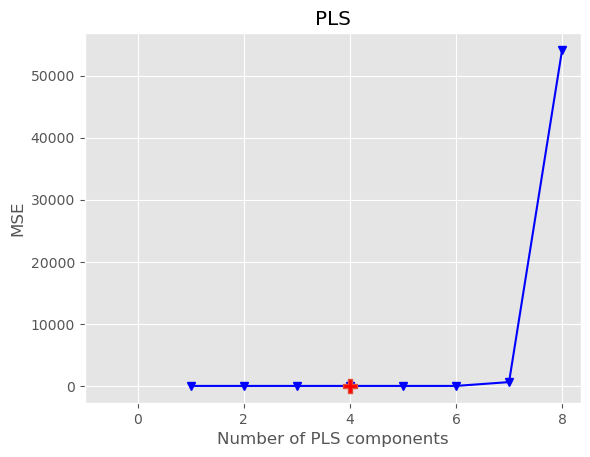

R2 calib: 0.490
R2 CV: 0.396
RMSE calib: 1.137
RMSE CV: 1.238

R2 test: 0.536
RMSE test: 0.939


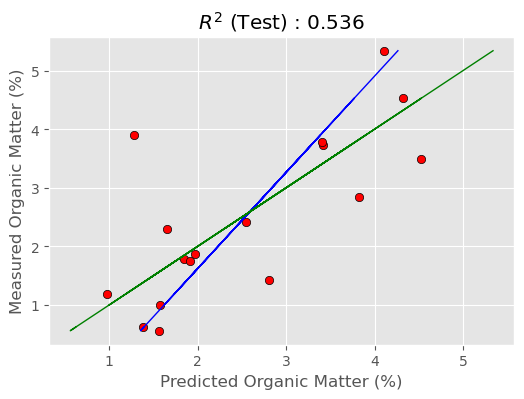

RPIQ: 0.37563319880013035


In [37]:
pls_model = optimise_pls_cv(X_train, y_train, X_test, y_test, 9, soilPro, plot_components=True)

# Train Predicted
y_train_pred = pls_model.predict(X_train)
y_train_pred = pd.DataFrame(y_train_pred, index=y_train.index, columns=['Predicted'])

# Test Predicted
y_pred = pls_model.predict(X_test)
y_pred = pd.DataFrame(y_pred, index=y_test.index, columns=['Predicted'])

# calculate IQR
q1 = np.percentile(y_pred, 25)
q3 = np.percentile(y_pred, 75)
iqrCal = q3 - q1

# calculate MAE
mae = mean_absolute_error(y_test, y_pred)

# calculate RPIQ
rpiq = mae / iqrCal
print("RPIQ:", rpiq)

# tempTrnDF = pd.concat([y_train, y_train_pred], axis=1)
# tempTrnDF['SE'] = (tempTrnDF[soilPro] - tempTrnDF['Predicted'])**2
# tempTstDF = pd.concat([y_test, y_pred], axis=1)
# tempTstDF['SE'] = (tempTstDF[soilPro] - tempTstDF['Predicted'])**2

# with pd.ExcelWriter(output_Predicted, engine="openpyxl") as writer:
#     tempTrnDF = pd.concat([y_train, y_train_pred], axis=1)
#     tempTrnDF.to_excel(writer, sheet_name='Cal_PLSR', index=True, header=True)
#     tempTstDF = pd.concat([y_test, y_pred], axis=1)
#     tempTstDF.to_excel(writer, sheet_name='Test_PLSR', index=True, header=True)
# writer=None

In [38]:
pls_new_model = (pls_model.coef_).T.ravel()

F:\sharad.gupta\Anaconda_ENVS_NotDelete\skg\lib\site-packages\sklearn\cross_decomposition\_pls.py:503: FutureWarning: The attribute `coef_` will be transposed in version 1.3 to be consistent with other linear models in scikit-learn. Currently, `coef_` has a shape of (n_features, n_targets) and in the future it will have a shape of (n_targets, n_features).
  warnings.warn(


<Figure size 400x300 with 0 Axes>

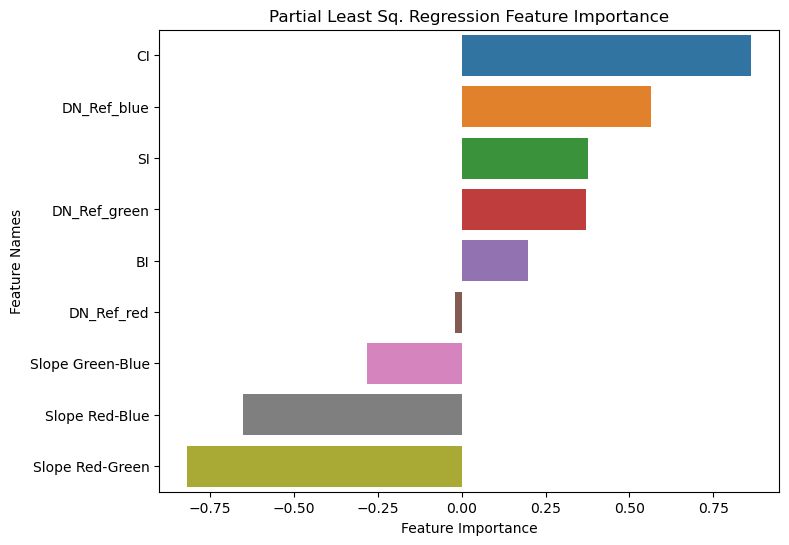

In [42]:
import seaborn as sns
plt.figure(figsize=(4,3))
plot_feature_importance(pls_new_model, X_train.columns, 'Partial Least Sq. Regression ')

## Ridge Regression

In [ ]:
# ridge_reg = Ridge(alpha=0.0001)
# ridge_reg.fit(X_train, y_train)

ridge_reg = Ridge()
alphas = np.logspace(-4, 4, 9)
param_grid = {'alpha': alphas}
scorer = make_scorer(r2_score, greater_is_better=True)
cv = RepeatedKFold(n_splits=5, n_repeats=3, random_state=3)
rr_random = GridSearchCV(ridge_reg, param_grid=param_grid, cv=cv,\
                                scoring=scorer, verbose=1, error_score='raise', n_jobs=-1)
rr_random.fit(X_train, y_train)

Ridge(alpha=0.01)

Calibration Results

Model Performance:
Absolute Error: 0.88
RMSE: 1.15
Coefficient of determination : 0.48

Validation Results

Model Performance:
Absolute Error: 0.64
RMSE: 0.90
Coefficient of determination : 0.58

RPIQ: 0.3331301432490094


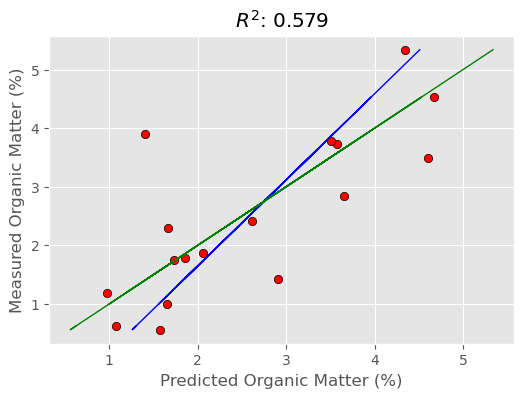

In [198]:
print(rr_random.best_estimator_)
y_pred = rr_random.predict(X_test)
y_pred = np.round(y_pred, 2)

score_cv = r2_score(y_test, y_pred)

print('\nCalibration Results')
evaluate(rr_random, X_train, y_train)

print('\nValidation Results')
evaluate(rr_random, X_test, y_test)

# calculate IQR
q1 = np.percentile(y_pred, 25)
q3 = np.percentile(y_pred, 75)
iqrCal = q3 - q1

# calculate MAE
mae = mean_absolute_error(y_test, y_pred)

# calculate RPIQ
rpiq = mae / iqrCal
print("\nRPIQ:", rpiq)

# Fit a line to the CV vs response
z = np.polyfit(y_test, y_pred, 1)
with plt.style.context(('ggplot')):
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.scatter(y_pred, y_test, c='red', edgecolors='k')
    ax.plot(np.polyval(z, y_test), y_test, c='blue', linewidth=1)
    ax.plot(y_test, y_test, color='green', linewidth=1)
    plt.title('$R^{2}$: '+str(np.round(score_cv,3)))
    plt.xlabel('Predicted ' + soilPro)
    plt.ylabel('Measured ' + soilPro)
    plt.show()

In [200]:
# Train Predicted
y_train_pred = rr_random.predict(X_train)
y_train_pred = pd.DataFrame(y_train_pred, index=y_train.index, columns=['Predicted'])

# Test Predicted
y_pred = rr_random.predict(X_test)
y_pred = pd.DataFrame(y_pred, index=y_test.index, columns=['Predicted'])

# with pd.ExcelWriter(output_Predicted, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
#     tempTrnDF = pd.concat([y_train, y_train_pred], axis=1)
#     tempTrnDF.to_excel(writer, sheet_name='Cal_RR', index=True, header=True)
#     tempTstDF = pd.concat([y_test, y_pred], axis=1)
#     tempTstDF.to_excel(writer, sheet_name='Test_RR', index=True, header=True)
# writer=None

In [201]:
ridge_reg = Ridge(alpha=0.01)
ridge_reg.fit(X_train, y_train)

Ridge(alpha=0.01)

<Figure size 400x300 with 0 Axes>

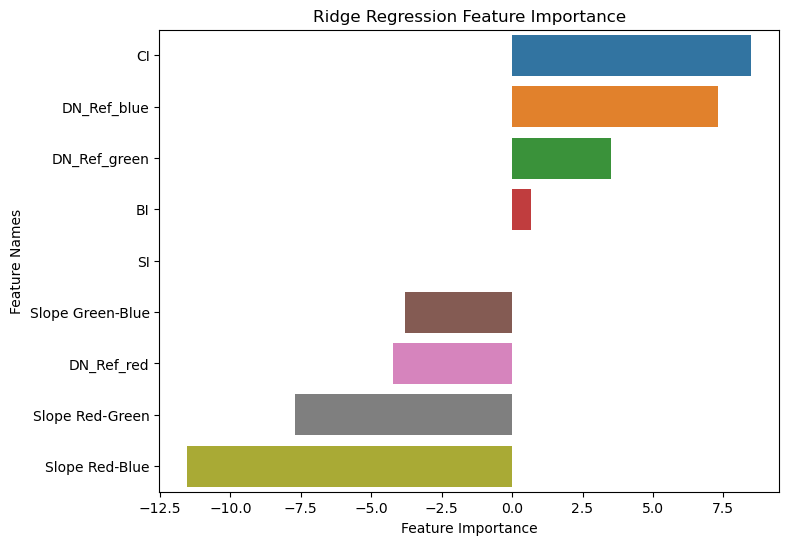

In [202]:
plt.figure(figsize=(4,3))
plot_feature_importance(ridge_reg.coef_, X_train.columns, 'Ridge Regression ')

## Linear Regression

In [204]:
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)

LinearRegression()


Calibration Results

Model Performance:
Absolute Error: 0.85
RMSE: 1.14
Coefficient of determination : 0.49

Validation Results

Model Performance:
Absolute Error: 0.70
RMSE: 0.94
Coefficient of determination : 0.54

RPIQ: 0.3794757033248082


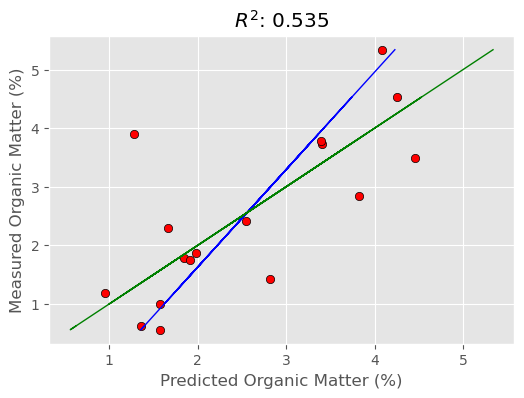

In [205]:
y_pred = lin_reg.predict(X_test)
y_pred = np.round(y_pred, 2)
# y_pred = pd.DataFrame(y_pred)

score_cv = r2_score(y_test, y_pred)

print('\nCalibration Results')
evaluate(lin_reg, X_train, y_train)

print('\nValidation Results')
evaluate(lin_reg, X_test, y_test)
# mape = MAPE(y_test, y_pred)
# print('Mean Absolute Percentage Error = ',mape)

# calculate IQR
q1 = np.percentile(y_pred, 25)
q3 = np.percentile(y_pred, 75)
iqrCal = q3 - q1

# calculate MAE
mae = mean_absolute_error(y_test, y_pred)

# calculate RPIQ
rpiq = mae / iqrCal
print("\nRPIQ:", rpiq)

# Fit a line to the CV vs response
z = np.polyfit(y_test, y_pred, 1)
with plt.style.context(('ggplot')):
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.scatter(y_pred, y_test, c='red', edgecolors='k')
    ax.plot(np.polyval(z, y_test), y_test, c='blue', linewidth=1)
    ax.plot(y_test, y_test, color='green', linewidth=1)
    plt.title('$R^{2}$: '+str(np.round(score_cv,3)))
    plt.xlabel('Predicted ' + soilPro)
    plt.ylabel('Measured ' + soilPro)
    plt.show()

In [213]:
# Train Predicted
y_train_pred = lin_reg.predict(X_train)
y_train_pred = pd.DataFrame(y_train_pred, index=y_train.index, columns=['Predicted'])

# Test Predicted
y_pred = lin_reg.predict(X_test)
y_pred = pd.DataFrame(y_pred, index=y_test.index, columns=['Predicted'])


# with pd.ExcelWriter(output_Predicted, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
#     tempTrnDF = pd.concat([y_train, y_train_pred], axis=1)
#     tempTrnDF.to_excel(writer, sheet_name='Cal_LR', index=True, header=True)
#     tempTstDF = pd.concat([y_test, y_pred], axis=1)
#     tempTstDF.to_excel(writer, sheet_name='Test_LR', index=True, header=True)
# writer=None

<Figure size 400x300 with 0 Axes>

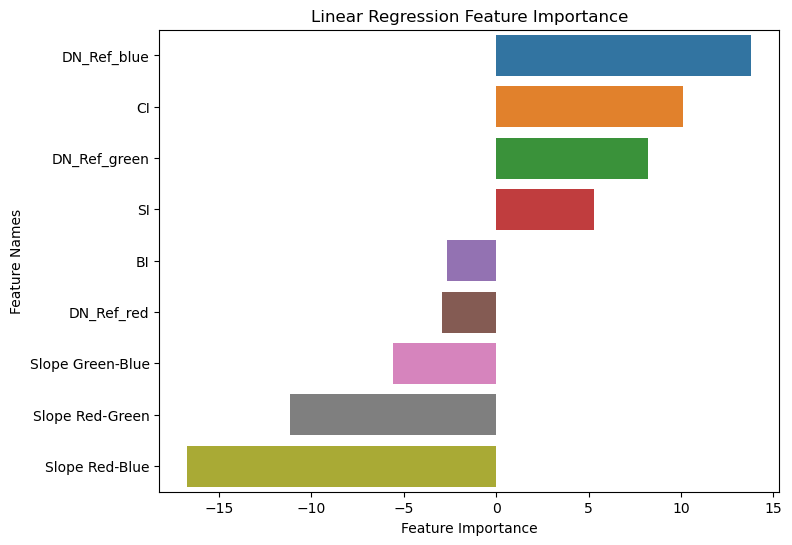

In [207]:
import seaborn as sns
plt.figure(figsize=(4,3))
plot_feature_importance(lin_reg.coef_, X_train.columns, 'Linear Regression ')

# Extra Analysis - Not included in the paper

## Linear Regression Std Plot

In [209]:
intercept = lin_reg.intercept_
features = pd.DataFrame(lin_reg.coef_, X_train.columns, columns=['coefficient'])
features.head(10)

,coefficient
DN_Ref_blue,13.795575
DN_Ref_green,8.242932
DN_Ref_red,-2.899767
Slope Green-Blue,-5.552643
Slope Red-Blue,-16.695342
Slope Red-Green,-11.142699
BI,-2.678652
CI,10.125911
SI,5.312992


In [210]:
features.coefficient = features.coefficient.abs()

stdevs = []

for i in X_train.columns:
    stdev = X_train[i].std()
    stdevs.append(stdev)

features["stdev"] = np.array(stdevs).reshape(-1,1)
features["importance"] = features["coefficient"] * features["stdev"]

In [211]:
features['importance_normalized'] = 100*features['importance'] / features['importance'].max()
features

,coefficient,stdev,importance,importance_normalized
DN_Ref_blue,13.795575,0.063300,0.873263,90.243385
DN_Ref_green,8.242932,0.077432,0.638266,65.958680
DN_Ref_red,2.899767,0.097502,0.282732,29.217638
Slope Green-Blue,5.552643,0.024987,0.138746,14.338027
Slope Red-Blue,16.695342,0.057961,0.967676,100.000000
Slope Red-Green,11.142699,0.037510,0.417959,43.192083
BI,2.678652,0.077129,0.206603,21.350442
CI,10.125911,0.076019,0.769762,79.547533
SI,5.312992,0.095024,0.504860,52.172483


<BarContainer object of 9 artists>

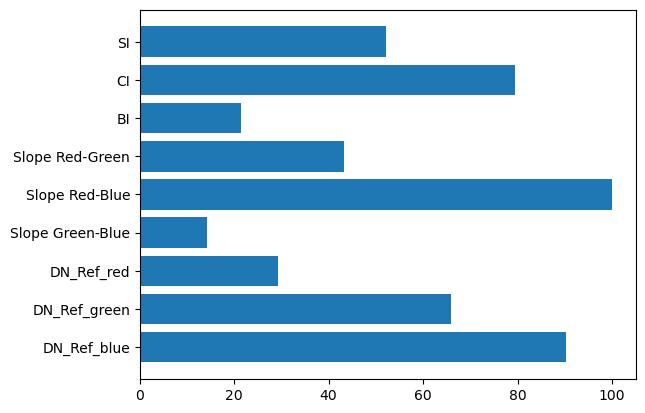

In [212]:
plt.barh(features.index, features.importance_normalized)

## Correlation between all features

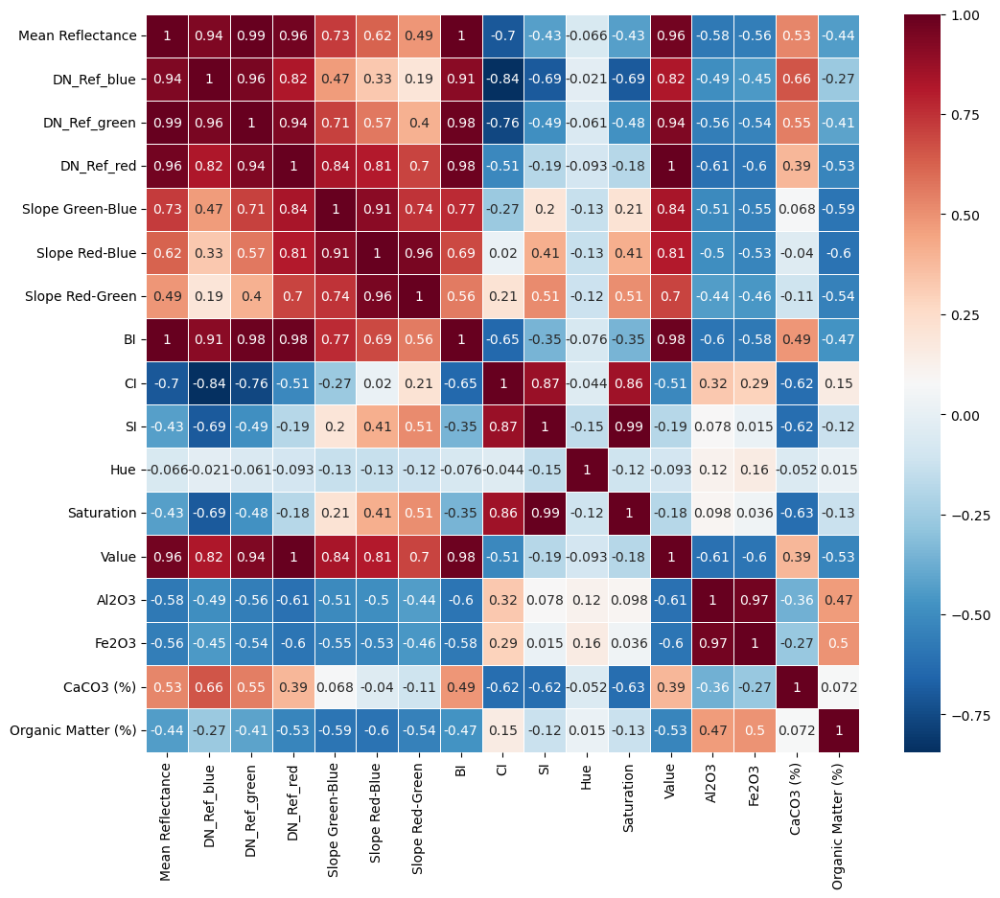

In [224]:
from scipy import stats
import seaborn as sns
%matplotlib inline

testDF = finalDF[['Mean Reflectance', 'DN_Ref_blue', 'DN_Ref_green', 'DN_Ref_red', 'Slope Green-Blue', 'Slope Red-Blue',\
                  'Slope Red-Green', 'BI', 'CI', 'SI', 'Hue', 'Saturation', 'Value', 'Al2O3','Fe2O3','CaCO3 (%)','Organic Matter (%)']]
pearsoncorr = testDF.corr(method='pearson')

plt.figure(figsize=(12, 10))
sns.heatmap(pearsoncorr, xticklabels=pearsoncorr.columns, 
           yticklabels=pearsoncorr.columns, 
           cmap='RdBu_r', annot=True,linewidth=0.5)
plt.savefig(output_folder+'/CorrelationPlot_Basic.png', bbox_inches='tight', dpi=300, transparent=False)

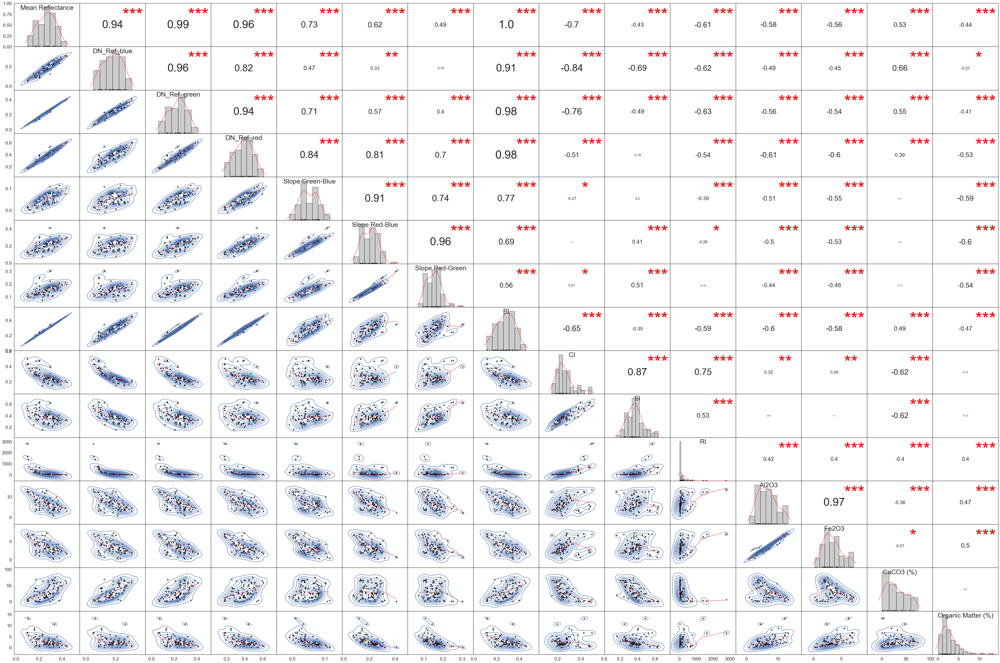

In [76]:
## Correlation Large Figure
import warnings
warnings.filterwarnings("ignore")

def corrdot(*args, **kwargs):
    corr_r = args[0].corr(args[1], 'pearson')
    corr_text = round(corr_r, 2)
    ax = plt.gca()
    font_size = abs(corr_r) * 40 + 5
    ax.annotate(corr_text, [.5, .5,],  xycoords="axes fraction",
                ha='center', va='center', fontsize=font_size)

def corrfunc(x, y, **kws):
    r, p = stats.pearsonr(x, y)
    p_stars = ''
    if p <= 0.05:
        p_stars = '*'
    if p <= 0.01:
        p_stars = '**'
    if p <= 0.001:
        p_stars = '***'
    ax = plt.gca()
    ax.annotate(p_stars, xy=(0.65, 0.6), xycoords=ax.transAxes,
                color='red', fontsize=70)

sns.set(style='white', font_scale=1.6)
g = sns.PairGrid(testDF, aspect=1.5, diag_sharey=False, despine=False)
g.map_lower(sns.regplot, lowess=True, ci=False,
            line_kws={'color': 'red', 'lw': 1},
            scatter_kws={'color': 'black', 's': 20})
g.map_lower(sns.kdeplot)
g.map_diag(sns.distplot, color='black',
           kde_kws={'color': 'red', 'cut': 0.7, 'lw': 1},
           hist_kws={'histtype': 'bar', 'lw': 2,
                     'edgecolor': 'k', 'facecolor':'grey'})
g.map_diag(sns.rugplot, color='black')
g.map_upper(corrdot)
g.map_upper(corrfunc)
g.fig.subplots_adjust(wspace=0, hspace=0)

# Remove axis labels
for ax in g.axes.flatten():
    ax.set_ylabel('')
    ax.set_xlabel('')

# Add titles to the diagonal axes/subplots
for ax, col in zip(np.diag(g.axes), testDF.columns):
    ax.set_title(col, y=0.82, fontsize=26)
plt.savefig(output_folder+'/CorrelationPlot.png', bbox_inches='tight', dpi=150, transparent=False)
sns = None
ax = None
fig = None

## Correlation between reflectance, derived features and soil properties

<Figure size 640x480 with 0 Axes>

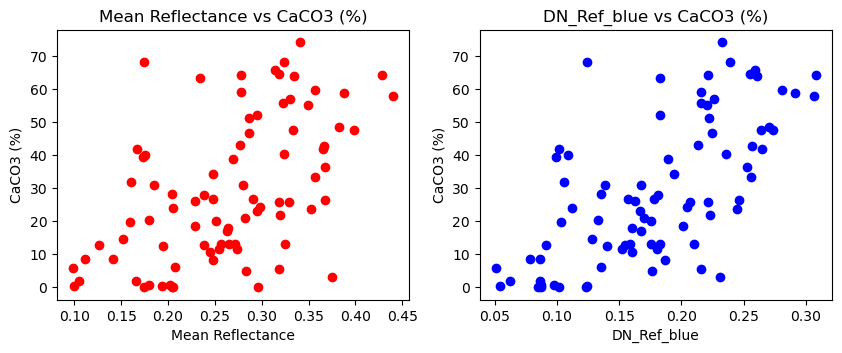

In [229]:
sns = None
matplotlib.rc_file_defaults()
%matplotlib inline
plt.figure()

# Fe(%) is better with mean
# Al2O3 is better with mean
# Organic Matter (%) is better with DN_Ref_red
# CaCO3 (%) is better with mean

# relX = 'Mean Reflectance'
# relX = 'DN_Ref_red'
# relX = 'DN_Ref_green'
relX = 'DN_Ref_blue'
# relX = ['Slope Green-Blue', 'Slope Red-Blue', 'Slope Red-Green']
# relX = 'Slope ASD GB'
# relX = 'Slope Green-Blue'
# relX = 'Slope Red-Green'
# relX = 'Slope Red-Blue'
# relX = 'BI' # Brightness Index
# relX = 'SI' # Saturation Index
# relX = 'CI' # Colouration Index
# relX = 'RI' # Redness Index
# relX = 'Blue'

# relY = 'Al2O3'
# relY = 'Fe2O3'
# relY = 'Fe (%)'
relY = 'CaCO3 (%)'
# relY = 'Clay (% wt.)'
# relY = 'Organic Matter (%)'

maxY = finalDF[relY].max()
maxX = finalDF[relX].loc[finalDF[relY] == maxY]

X = finalDF[relX]#/maxX.values
y = finalDF[relY]

fig, ax = plt.subplots(1,2,figsize=(10,3.5))
ax[0].plot(finalDF['Mean Reflectance'], y, 'ro')
# plt.xlim([0, 0.6])
ax[0].set_xlabel('Mean Reflectance')
ax[0].set_ylabel(relY)
ax[0].set_title('Mean Reflectance' + ' vs ' + relY)

ax[1].plot(X, y, 'bo')
# plt.xlim([0, 0.6])
ax[1].set_xlabel(relX)
ax[1].set_ylabel(relY)
ax[1].set_title(relX + ' vs ' + relY)
plt.show()
# plt.close()

## Removal of selected soils

<IPython.core.display.Javascript object>


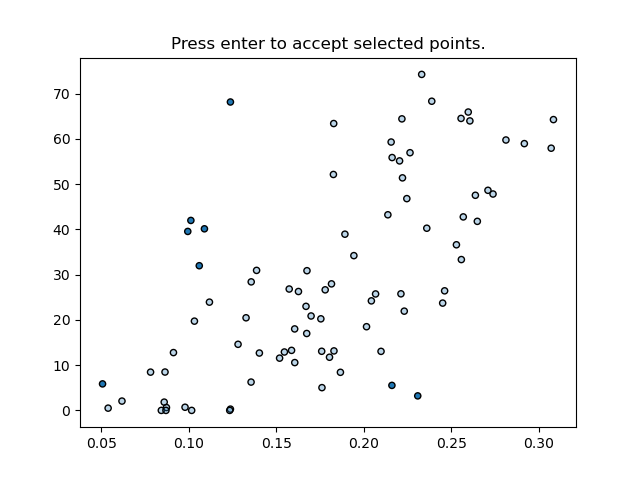

In [226]:
from matplotlib.widgets import LassoSelector
from matplotlib.path import Path
%matplotlib notebook

class SelectFromCollection:
    """Select indices from a matplotlib collection using `LassoSelector`.

    Selected indices are saved in the `ind` attribute. This tool fades out the
    points that are not part of the selection (i.e., reduces their alpha
    values). If your collection has alpha < 1, this tool will permanently
    alter the alpha values.

    Note that this tool selects collection objects based on their *origins*
    (i.e., `offsets`).

    Parameters
    ----------
    ax : :class:`~matplotlib.axes.Axes`
        Axes to interact with.

    collection : :class:`matplotlib.collections.Collection` subclass
        Collection you want to select from.

    alpha_other : 0 <= float <= 1
        To highlight a selection, this tool sets all selected points to an
        alpha value of 1 and non-selected points to `alpha_other`.
    """

    def __init__(self, ax, collection, alpha_other=0.3):
        self.canvas = ax.figure.canvas
        self.collection = collection
        self.alpha_other = alpha_other

        self.xys = collection.get_offsets()
        self.Npts = len(self.xys)

        # Ensure that we have separate colors for each object
        self.fc = collection.get_facecolors()
        if len(self.fc) == 0:
            raise ValueError('Collection must have a facecolor')
        elif len(self.fc) == 1:
            self.fc = np.tile(self.fc, (self.Npts, 1))

        self.lasso = LassoSelector(ax, onselect=self.onselect)
        self.ind = []

    def onselect(self, verts):
        path = Path(verts)
        self.ind = np.nonzero(path.contains_points(self.xys))[0]
        self.fc[:, -1] = self.alpha_other
        self.fc[self.ind, -1] = 1
        self.collection.set_facecolors(self.fc)
        self.canvas.draw_idle()

    def disconnect(self):
        self.lasso.disconnect_events()
        self.fc[:, -1] = 1
        self.collection.set_facecolors(self.fc)
        self.canvas.draw_idle()

if __name__ == '__main__':
    import matplotlib.pyplot as plt

    # Fixing random state for reproducibility
    np.random.seed(19680801)

#     data = np.random.rand(100, 2)

    subplot_kw = dict(xlim=(0, 0.8), autoscale_on=True)
    fig, ax = plt.subplots(subplot_kw=subplot_kw)

#     pts = ax.scatter(data[:, 0], data[:, 1], s=80)
    pts = ax.scatter(X, y, edgecolors = edge, s = 20)
    selector = SelectFromCollection(ax, pts)

    def accept(event):
        if event.key == "enter":
            print("Selected points:")
            print(selector.xys[selector.ind])
            selector.disconnect()
            ax.set_title("")
            fig.canvas.draw()

    fig.canvas.mpl_connect("key_press_event", accept)
    ax.set_title("Press enter to accept selected points.")

    plt.show()

In [227]:
idx_to_remove = list(selector.ind)
idx_to_remove

[1, 5, 8, 11, 12, 21, 34, 35]

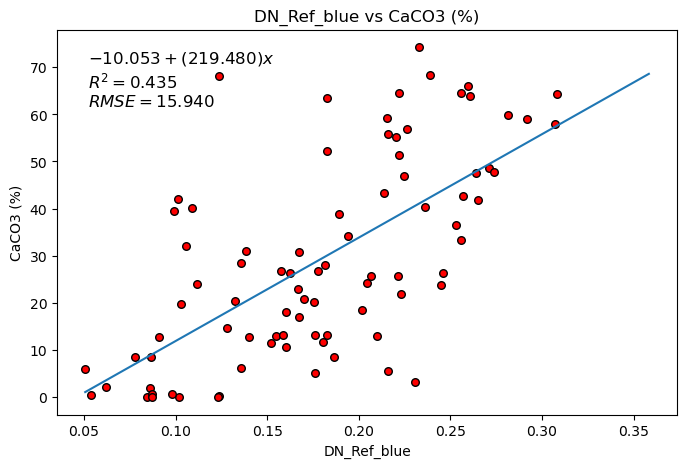

In [228]:
# excludedSoils = pd.DataFrame(finalDF.index[idx_to_remove])
# finalDF.drop(finalDF.index[idx_to_remove], inplace=True)

%matplotlib inline
fig, ax = plt.subplots(figsize = (8,5))

X = finalDF[relX]
# X = finalDF[['Slope Green-Blue', 'Slope Red-Blue', 'Slope Red-Green']]
# X = finalDF[['Slope Green-Blue', 'Slope Red-Blue', 'Slope Red-Green']]
y = finalDF[relY]

# regr = linear_model.LinearRegression()
# regr.fit(X, y)
# print('Intercept: \n', regr.intercept_)
# print('Coefficients: \n', regr.coef_)
# yhat = regr.predict(X)
# score = r2_score(y, yhat)
# print('r2 score is ', np.round(score, 3))
# print('Mean absolute Error = ', np.round(mean_absolute_error(y, yhat), 3))

poly, x_range, poly_trend, rsquared, rmse = curveFitting(X, y, 1)
ax.scatter(X, y, c='red', edgecolors = edge, s = 30)
ax.set_xlabel(relX)
# ax.set_xlim([0, max(X)+0.05])
# ax.set_ylim([0, max(y)+0.5])
ax.set_ylabel(relY)
ax.set_title(relX + ' vs ' + relY)
ax.plot(x_range, poly_trend)

plt.gca().text(0.05, 0.95, poly2latex(poly), fontsize=12, verticalalignment='top', horizontalalignment='left', transform=ax.transAxes)
textRSq = f"\n$R^2 = {rsquared:0.3f}$\n$RMSE = {rmse:0.3f}$"
plt.gca().text(0.05, 0.94, textRSq, fontsize=12, verticalalignment='top', horizontalalignment='left', transform=ax.transAxes)
soilRelExport = './' + output_folder + '/' + relX + '_' + relY + '_relation'
plt.savefig(soilRelExport + ".png", bbox_inches = 'tight', dpi=300, transparent=False)

In [186]:
with pd.ExcelWriter(soilRelExport + ".xlsx") as writer:
    soilRelation = pd.concat([X, y], axis=1)
    soilRelation.to_excel(writer, sheet_name='soilRelation', index=True, header=True)
    excludedSoils.to_excel(writer, sheet_name='excludedSoils', index=False, header=True)

writer=None